### Input image

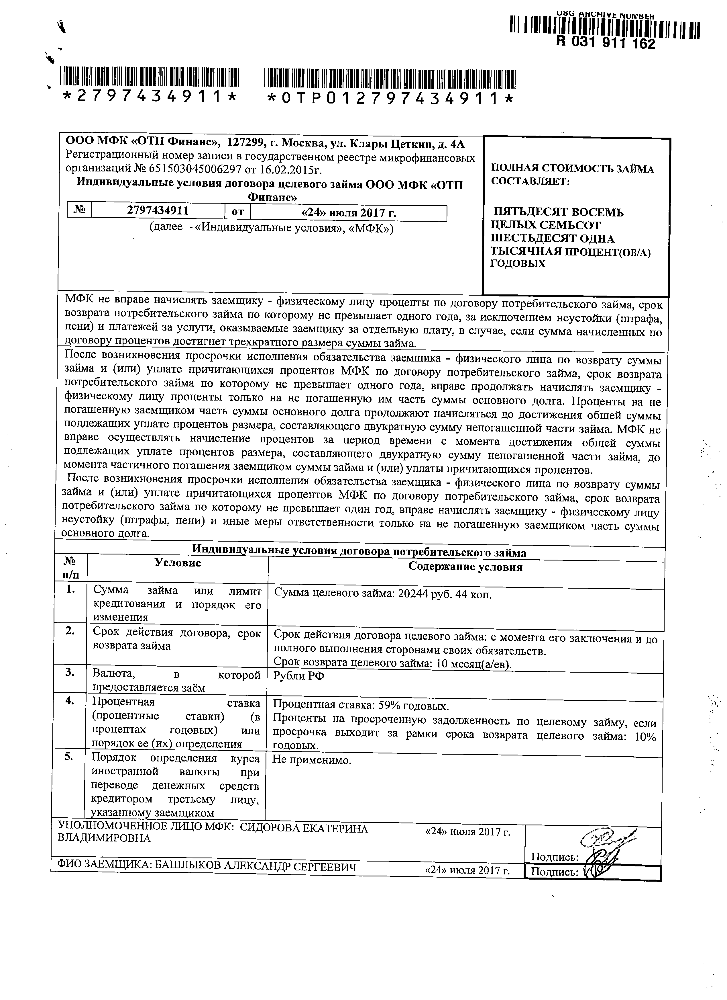

In [18]:
from PIL import Image
file_path = r"C:\Users\t.abraamyan\Documents\PythonPRJ\TableFinderDev\data\default\pos_credit_1_page-0001.jpg"
image = Image.open(file_path)
image

## deskew library

In [19]:
import numpy as np
from skimage import io
from skimage.color import rgb2gray
from skimage.transform import rotate

from deskew import determine_skew
image_array = np.array(image)
# image_io = io.imread(image_array)
grayscale = rgb2gray(image_array)
angle = determine_skew(grayscale)
rotated = rotate(image_array, angle, resize=True) * 255

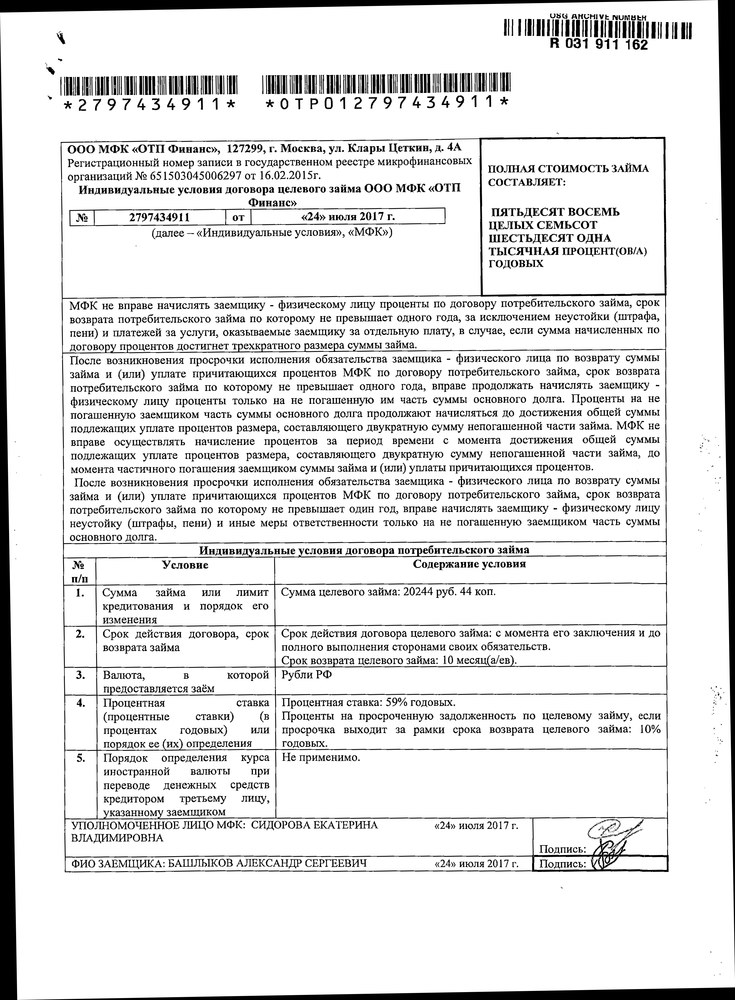

In [20]:
pil_res = Image.fromarray(rotated.astype(np.uint8))
pil_res

In [21]:
import math
from typing import Tuple, Union

import cv2
import numpy as np

from deskew import determine_skew


def rotate(
        image: np.ndarray, angle: float, background: Union[int, Tuple[int, int, int]]
) -> np.ndarray:
    old_width, old_height = image.shape[:2]
    angle_radian = math.radians(angle)
    width = abs(np.sin(angle_radian) * old_height) + abs(np.cos(angle_radian) * old_width)
    height = abs(np.sin(angle_radian) * old_width) + abs(np.cos(angle_radian) * old_height)

    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    rot_mat[1, 2] += (width - old_width) / 2
    rot_mat[0, 2] += (height - old_height) / 2
    return cv2.warpAffine(image, rot_mat, (int(round(height)), int(round(width))), borderValue=background)

# image = cv2.imread('input.png')
image_array = np.array(image)
grayscale = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)
angle = determine_skew(grayscale)
rotated = rotate(image_array, angle, (0, 0, 0))
# cv2.imwrite('output.png', rotated)

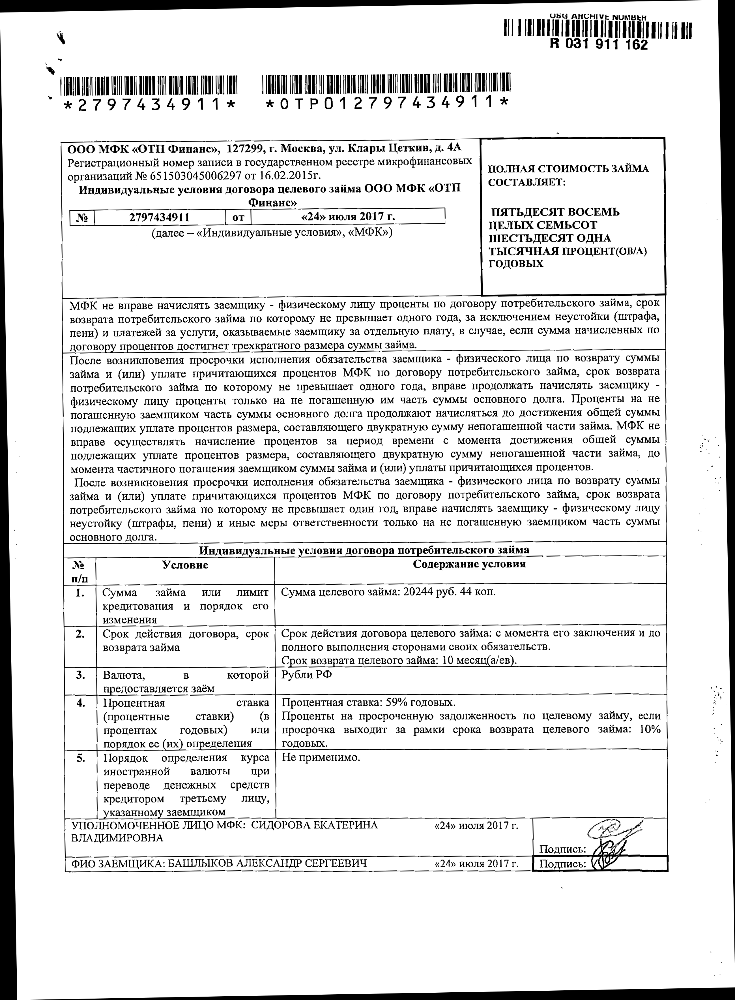

In [22]:
pil_res = Image.fromarray(rotated.astype(np.uint8))
pil_res

In [23]:
img = np.array(image)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.GaussianBlur(gray, (9, 9), 0)
resized_height = 480
percent = resized_height / len(img)
resized_width = int(percent * len(img[0]))
gray = cv2.resize(gray,(resized_width,resized_height))
start_point = (0, 0)
end_point = (gray.shape[0], gray.shape[1])
color = (255, 255, 255)
thickness = 10
gray = cv2.rectangle(gray, start_point, end_point, color, thickness)
gray = cv2.bitwise_not(gray)
thresh = cv2.threshold(gray, 0, 255,
        cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
dilate = cv2.dilate(thresh, kernel)

In [24]:
contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

In [25]:
angles = []
for contour in contours:
    minAreaRect = cv2.minAreaRect(contour)
    angle = minAreaRect[-1]
    if angle != 90.0 and angle != -0.0: #filter out 0 and 90
        angles.append(angle)



In [26]:
angles.sort()
mid_angle = angles[int(len(angles)/2)]

In [27]:
if angle > 45: #anti-clockwise
        angle = -(90 - angle)
height = img.shape[0]
width = img.shape[1]
m = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1)
deskewed = cv2.warpAffine(img, m, (width, height), borderValue=(255,255,255))

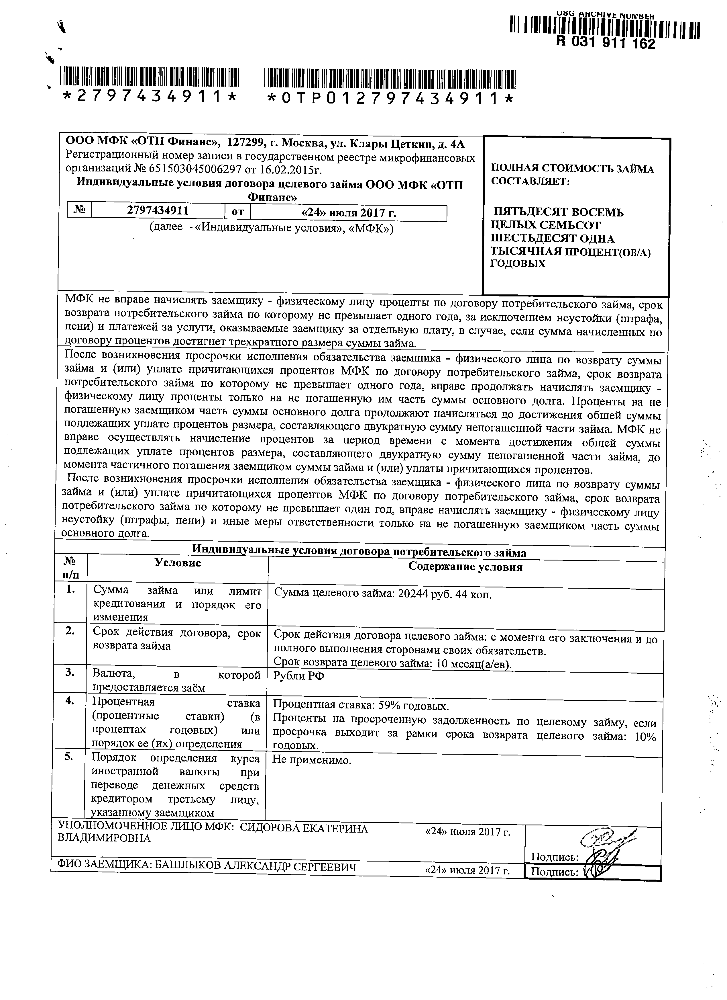

In [28]:
deskewed_img = Image.fromarray(deskewed.astype(np.uint8))
deskewed_img

# 3-d party Library Magick Check
using wand binding


In [29]:
from wand.image import Image
from wand.display import display

img_v = None
with Image(filename=file_path) as img:
    img.deskew(0.4*img.quantum_range)
    img_v = img.clone()
    img.save(filename='form1_deskew.png')
    display(img)

# with Image(filename=) as img:
#     img.deskew(0.4*img.quantum_range)
#     img.save(filename='form2_deskew.png')
#     display(img)

In [31]:
type(img_v)

wand.image.Image

In [36]:
from PIL import  Image
pil_img = Image.fromarray(np.array(img_v))

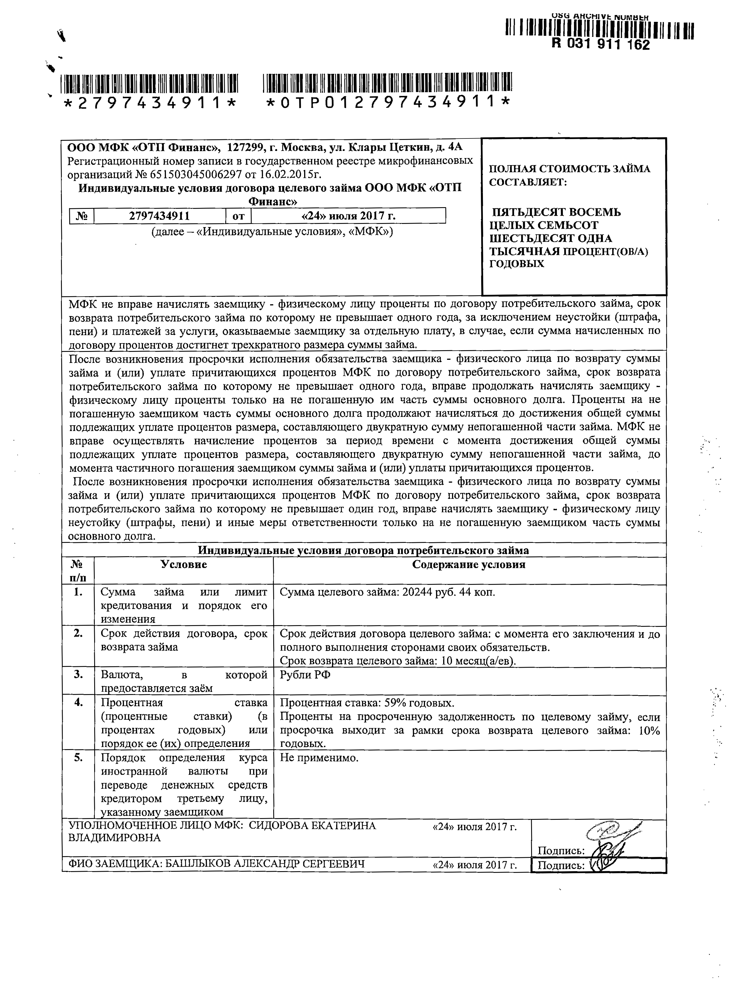

In [37]:
pil_img

In [ ]:
pil_img.save()